Load Libraries

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

importing data directly from kaggle


In [2]:
! pip install -q kaggle

In [3]:
!pip install opendatasets


In [6]:
import opendatasets as od

od.download("https://www.kaggle.com/datasets/varundeepakgudhe/crime-data-from-2020-to-present-in-los-angeles")


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: iusmanmaqbool
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/varundeepakgudhe/crime-data-from-2020-to-present-in-los-angeles


100%|██████████| 46.2M/46.2M [00:00<00:00, 68.3MB/s]


In [5]:
df = pd.read_csv('/content/crime-data-from-2020-to-present-in-los-angeles/Crime_Data_from_2020_to_Present.csv')

# Lets explore and understand data

In [8]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,08/18/2022 12:00:00 AM,08/17/2020 12:00:00 AM,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,...,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277


In [9]:
df.tail(3)

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
932137,242106032,02/20/2024 12:00:00 AM,02/17/2024 12:00:00 AM,2330,21,Topanga,2103,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),...,IC,Invest Cont,420.0,NaN,NaN,NaN,22700 NAPA ST,NaN,34.2260,-118.6214
932138,242004546,01/16/2024 12:00:00 AM,01/16/2024 12:00:00 AM,1510,20,Olympic,2013,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,HOBART BL,3RD ST,34.0690,-118.3054
932139,240104953,01/15/2024 12:00:00 AM,01/15/2024 12:00:00 AM,100,1,Central,101,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,NaN,NaN,NaN,1300 W SUNSET BL,NaN,34.0685,-118.2460


Some Columns Are hidden Not Show in df.head() Lets Check

In [6]:
pd.set_option('display.max_columns', None)
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0,M,O,101.0,STREET,NaN,NaN,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),NaN,NaN,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,19,M,O,405.0,CLOTHING STORE,NaN,NaN,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,08/18/2022 12:00:00 AM,08/17/2020 12:00:00 AM,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,1822 1501 0930 2004,28,M,H,102.0,SIDEWALK,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277


In [7]:
df.shape

(932140, 28)

In [8]:
df.describe()

,DR_NO,TIME OCC,AREA,Rpt Dist No,Part 1-2,Crm Cd,Vict Age,Premis Cd,Weapon Used Cd,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LAT,LON
count,9.321400e+05,932140.000000,932140.000000,932140.000000,932140.000000,932140.000000,932140.000000,932130.000000,321339.000000,932129.000000,67590.000000,2265.000000,64.00000,932140.000000,932140.000000
mean,2.185885e+08,1337.717757,10.711552,1117.594370,1.410221,500.820799,29.544078,306.613841,363.632080,500.565202,958.034694,983.983223,991.21875,33.991109,-118.067008
std,1.227977e+07,652.577100,6.100501,610.077215,0.491874,207.444585,21.868290,217.467312,123.609686,207.237336,110.396406,51.944671,27.06985,1.680895,5.826718
min,8.170000e+02,1.000000,1.000000,101.000000,1.000000,110.000000,-4.000000,101.000000,101.000000,110.000000,210.000000,310.000000,821.00000,0.000000,-118.667600
25%,2.104159e+08,900.000000,6.000000,615.000000,1.000000,331.000000,0.000000,101.000000,311.000000,331.000000,998.000000,998.000000,998.00000,34.014500,-118.430100
50%,2.206121e+08,1417.000000,11.000000,1141.000000,1.000000,442.000000,31.000000,203.000000,400.000000,442.000000,998.000000,998.000000,998.00000,34.058800,-118.322300
75%,2.306094e+08,1900.000000,16.000000,1617.000000,2.000000,626.000000,45.000000,501.000000,400.000000,626.000000,998.000000,998.000000,998.00000,34.164800,-118.273900
max,2.499138e+08,2359.000000,21.000000,2199.000000,2.000000,956.000000,120.000000,976.000000,516.000000,956.000000,999.000000,999.000000,999.00000,34.334300,0.000000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 932140 entries, 0 to 932139
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           932140 non-null  int64  
 1   Date Rptd       932140 non-null  object 
 2   DATE OCC        932140 non-null  object 
 3   TIME OCC        932140 non-null  int64  
 4   AREA            932140 non-null  int64  
 5   AREA NAME       932140 non-null  object 
 6   Rpt Dist No     932140 non-null  int64  
 7   Part 1-2        932140 non-null  int64  
 8   Crm Cd          932140 non-null  int64  
 9   Crm Cd Desc     932140 non-null  object 
 10  Mocodes         801530 non-null  object 
 11  Vict Age        932140 non-null  int64  
 12  Vict Sex        807934 non-null  object 
 13  Vict Descent    807924 non-null  object 
 14  Premis Cd       932130 non-null  float64
 15  Premis Desc     931578 non-null  object 
 16  Weapon Used Cd  321339 non-null  float64
 17  Weapon Des

Check Duplicates

In [10]:
df.duplicated().sum()

0

In [11]:
df[df.duplicated()]

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON


In [12]:
df.isnull().sum()

DR_NO                  0
Date Rptd              0
DATE OCC               0
TIME OCC               0
AREA                   0
AREA NAME              0
Rpt Dist No            0
Part 1-2               0
Crm Cd                 0
Crm Cd Desc            0
Mocodes           130610
Vict Age               0
Vict Sex          124206
Vict Descent      124216
Premis Cd             10
Premis Desc          562
Weapon Used Cd    610801
Weapon Desc       610801
Status                 0
Status Desc            0
Crm Cd 1              11
Crm Cd 2          864550
Crm Cd 3          929875
Crm Cd 4          932076
LOCATION               0
Cross Street      786138
LAT                    0
LON                    0
dtype: int64

Check Missing Values and their percentage in columns

In [13]:
df.isnull().sum()*100/len(df)

DR_NO              0.000000
Date Rptd          0.000000
DATE OCC           0.000000
TIME OCC           0.000000
AREA               0.000000
AREA NAME          0.000000
Rpt Dist No        0.000000
Part 1-2           0.000000
Crm Cd             0.000000
Crm Cd Desc        0.000000
Mocodes           14.011844
Vict Age           0.000000
Vict Sex          13.324822
Vict Descent      13.325895
Premis Cd          0.001073
Premis Desc        0.060291
Weapon Used Cd    65.526745
Weapon Desc       65.526745
Status             0.000000
Status Desc        0.000000
Crm Cd 1           0.001180
Crm Cd 2          92.748943
Crm Cd 3          99.757011
Crm Cd 4          99.993134
LOCATION           0.000000
Cross Street      84.336902
LAT                0.000000
LON                0.000000
dtype: float64

Drop columns that are useless and have Missing values >**70**

In [14]:
df= df.drop(columns=['Weapon Used Cd','Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'Cross Street'])

some irrelevent columns according to our case study

In [15]:
df=df.drop(columns=['DR_NO','AREA', 'Rpt Dist No','Mocodes'], axis=1)

In [16]:
df.isnull().mean()*100

Date Rptd        0.000000
DATE OCC         0.000000
TIME OCC         0.000000
AREA NAME        0.000000
Part 1-2         0.000000
Crm Cd           0.000000
Crm Cd Desc      0.000000
Vict Age         0.000000
Vict Sex        13.324822
Vict Descent    13.325895
Premis Cd        0.001073
Premis Desc      0.060291
Weapon Desc     65.526745
Status           0.000000
Status Desc      0.000000
Crm Cd 1         0.001180
LOCATION         0.000000
LAT              0.000000
LON              0.000000
dtype: float64

<Axes: >

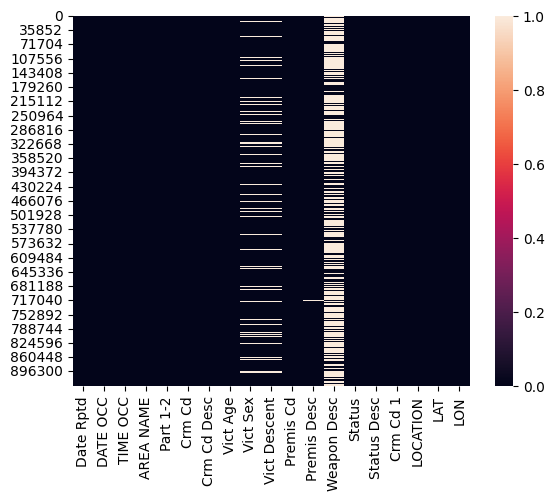

In [21]:
sns.heatmap(df.isnull())

In [17]:
df.columns

Index(['Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA NAME', 'Part 1-2', 'Crm Cd',
       'Crm Cd Desc', 'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd',
       'Premis Desc', 'Weapon Desc', 'Status', 'Status Desc', 'Crm Cd 1',
       'LOCATION', 'LAT', 'LON'],
      dtype='object')

In [20]:
df['Vict Sex'].fillna(df['Vict Sex'].mode()[0], inplace=True)

In [21]:
df['Vict Age'].fillna(df['Vict Age'].mean(), inplace=True)

In [22]:
df['Weapon Desc'].unique()

array([nan, 'STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)', 'VEHICLE',
       'UNKNOWN WEAPON/OTHER WEAPON', 'VERBAL THREAT',
       'BELT FLAILING INSTRUMENT/CHAIN', 'HAND GUN', 'UNKNOWN FIREARM',
       'KNIFE WITH BLADE 6INCHES OR LESS', 'FIXED OBJECT',
       'KITCHEN KNIFE', 'MACHETE', 'UNKNOWN TYPE CUTTING INSTRUMENT',
       'MACE/PEPPER SPRAY', 'CLUB/BAT', 'STICK', 'OTHER KNIFE',
       'PHYSICAL PRESENCE', 'KNIFE WITH BLADE OVER 6 INCHES IN LENGTH',
       'HAMMER', 'AIR PISTOL/REVOLVER/RIFLE/BB GUN',
       'SEMI-AUTOMATIC PISTOL', 'SIMULATED GUN', 'RAZOR', 'OTHER FIREARM',
       'FOLDING KNIFE', 'PIPE/METAL PIPE', 'ROCK/THROWN OBJECT', 'RIFLE',
       'OTHER CUTTING INSTRUMENT', 'FIRE', 'REVOLVER', 'BOTTLE',
       'SCISSORS', 'SWITCH BLADE', 'BRASS KNUCKLES', 'BLUNT INSTRUMENT',
       'BOARD', 'STUN GUN', 'CLEAVER', 'RAZOR BLADE', 'SCREWDRIVER',
       'SHOTGUN', 'CONCRETE BLOCK/BRICK', 'CAUSTIC CHEMICAL/POISON',
       'SEMI-AUTOMATIC RIFLE', 'SCALDING LIQUID', 'TIRE I

Fill missing values in Weapon Desc with 'Unknown'

In [24]:
df['Weapon Desc'].fillna('Unknown', inplace=True)

In [25]:
df['Vict Descent'].fillna('Unknown', inplace=True)


In [26]:
df.shape

(932140, 19)

Convert 'Date Rptd' and 'DATE OCC' columns to datetime

In [27]:
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], format='%m/%d/%Y %I:%M:%S %p', errors='coerce')
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], format='%m/%d/%Y %I:%M:%S %p', errors='coerce')

Convert 'TIME OCC' to a proper time format

In [28]:
df["TIME OCC"] = df["TIME OCC"].astype(str).str.zfill(4)

In [29]:
df["TIME OCC"] = pd.to_datetime(df["TIME OCC"], format='%H%M', errors='coerce').dt.time

In [2]:
sns.heatmap(df.corr() , annot=True, cmap='coolwarm')
plt.rcParams['figure.figsize']= (20,8)
plt.show()


NameError: name 'sns' is not defined

***Lets Visualize insights***

In [30]:
import plotly.express as px

In [31]:
crime_cousnt = df['Crm Cd Desc'].value_counts().head(20)
crime_cousnt

Crm Cd Desc
VEHICLE - STOLEN                                            100225
BATTERY - SIMPLE ASSAULT                                     73759
THEFT OF IDENTITY                                            57539
BURGLARY FROM VEHICLE                                        57538
BURGLARY                                                     57015
VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)      56525
ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT               52677
THEFT PLAIN - PETTY ($950 & UNDER)                           47568
INTIMATE PARTNER - SIMPLE ASSAULT                            46165
THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)              36019
THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)          33334
ROBBERY                                                      31683
THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD     31176
SHOPLIFTING - PETTY THEFT ($950 & UNDER)                     24714
VANDALISM - MISDEAMEANOR ($399 OR UNDER)          

Top 20 Common Crime Types (2020-2024)

In [32]:
# Count the occurrences of each crime type
crime_counts = df['Crm Cd Desc'].value_counts().head(20)  # Top 20 crime types
crime_counts = crime_counts.reset_index()
crime_counts.columns = ['Crime Description', 'Count']

# Sort the data by count in descending order
crime_counts = crime_counts.sort_values(by='Count', ascending=True)

# Create an interactive bar chart using Plotly
fig = px.bar(
    crime_counts,
    x='Count',
    y='Crime Description',
    orientation='h',
    title='Common Crime Types (2020 - 2024)',
    labels={'Count': 'Distinct Crime Counts', 'Crime Description': 'Crime Description'},
    text='Count'
)

# Update layout for better appearance
fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},
    xaxis=dict(title='Distinct Crime Counts'),
    yaxis=dict(title='Crime Description', categoryorder='total ascending'),
    template='plotly_white'
)

# Display the plot
fig.show()

Extract day of the week

In [33]:
df['DayOfWeek'] = df['DATE OCC'].dt.day_name()


**Count** crimes per day of the week

In [34]:
crime_counts_by_day = df['DayOfWeek'].value_counts().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
crime_counts_by_day = crime_counts_by_day.reset_index()
crime_counts_by_day.columns = ['DayOfWeek', 'Count']

In [35]:

# Create a treemap
fig = px.treemap(
    crime_counts_by_day,
    path=['DayOfWeek'],
    values='Count',
    title='Crime Count by Day of Week (2020 - 2024)',
    color='Count',
    color_continuous_scale='RdYlGn'
)

# Update layout for better appearance
fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},
    template='plotly_white'
)

# Display the plot
fig.show()

Crime Count by Hour of Day (2020 - 2024)

In [36]:

# Count the number of crimes for each hour of the day
crime_counts_by_hour = df['TIME OCC'].value_counts().sort_index()
crime_counts_by_hour = crime_counts_by_hour.reset_index()
crime_counts_by_hour.columns = ['Hour', 'Count']

# Create an area chart
fig = px.area(
    crime_counts_by_hour,
    x='Hour',
    y='Count',
    title='Crime Count by Hour of Day (2020 - 2024)',
    labels={'Hour': 'Time of Day (24H Format)', 'Count': 'Crime Count'},
)

# Update layout for better appearance
fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},
    template='plotly_white',
    xaxis=dict(tickmode='linear'),
    yaxis=dict(title='Crime Count')
)

# Display the plot
fig.show()


Create a mapping of descent codes to full descriptions

In [37]:
descent_mapping = {
    'A': 'Other Asian',
    'B': 'Black',
    'C': 'Chinese',
    'D': 'Cambodian',
    'F': 'Filipino',
    'G': 'Guamanian',
    'H': 'Hispanic/Latin/Mexican',
    'I': 'American Indian/Alaskan Native',
    'J': 'Japanese',
    'K': 'Korean',
    'L': 'Laotian',
    'O': 'Other',
    'P': 'Pacific Islander',
    'S': 'Samoan',
    'U': 'Hawaiian',
    'V': 'Vietnamese',
    'W': 'White',
    'X': 'Unknown',
    'Z': 'Asian Indian'
}

df['Victim Descent'] = df['Vict Descent'].map(descent_mapping)

In [38]:
crime_counts_by_race = df['Victim Descent'].value_counts().reset_index()
crime_counts_by_race.columns = ['Victim Descent', 'Count']

# Create a bubble chart
fig = px.scatter(
    crime_counts_by_race,
    x='Victim Descent',
    y='Count',
    size='Count',
    color='Victim Descent',
    title='Crime Count by Race (2020 - 2024)',
    labels={'Count': 'Crime Count', 'Victim Descent': 'Victim Descent'},
    size_max=60
)

# Update layout for better appearance
fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},
    template='plotly_white'
)

# Display the plot
fig.show()

Filter to only include "Male", "Female", and "Unknown"

In [39]:
filtered_data = df[df['Vict Sex'].isin(['M', 'F', 'X'])]

Count the number of crimes for each gender

In [40]:
crime_counts_by_gender = filtered_data['Vict Sex'].value_counts().reset_index()
crime_counts_by_gender.columns = ['Vict Sex', 'Count']

In [41]:
gender_mapping = {'M': 'Male', 'F': 'Female', 'X': 'Unknown'}
crime_counts_by_gender['Vict Sex'] = crime_counts_by_gender['Vict Sex'].map(gender_mapping)

# Create a pie chart
fig = px.pie(
    crime_counts_by_gender,
    names='Vict Sex',
    values='Count',
    title='Crime Count by Gender (2020 - 2024)',
    color_discrete_sequence=px.colors.qualitative.Set1
)

# Display the plot
fig.show()

Count the number of crimes for each location

<ipython-input-42-1e65b9c84bc4>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




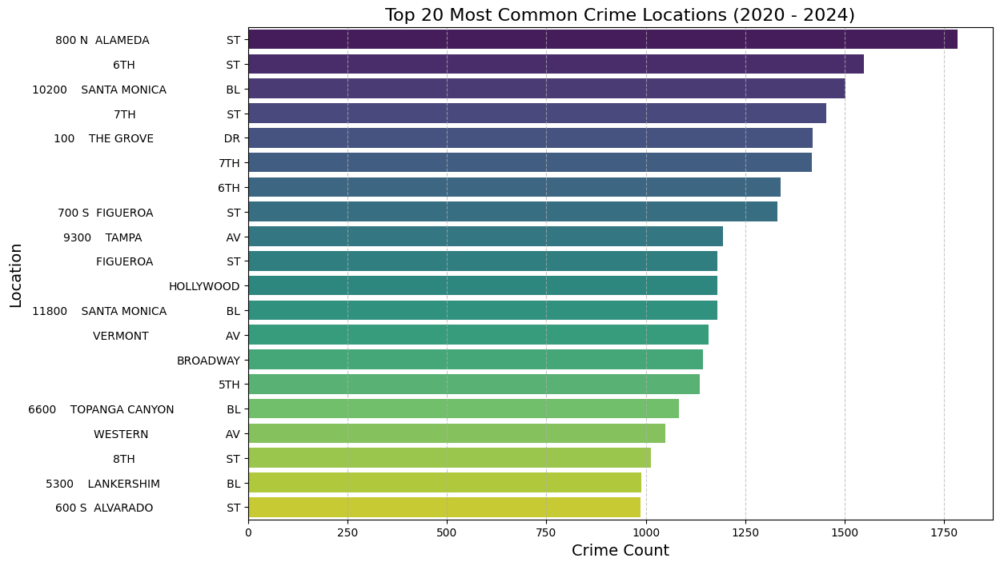

In [42]:
crime_counts_by_location = filtered_data['LOCATION'].value_counts().reset_index()
crime_counts_by_location.columns = ['Location', 'Count']

# Select the top 20 locations for visualization
top_locations = crime_counts_by_location.head(20)

# Create a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='Location', data=top_locations, palette='viridis')
plt.title('Top 20 Most Common Crime Locations (2020 - 2024)', fontsize=16)
plt.xlabel('Crime Count', fontsize=14)
plt.ylabel('Location', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [43]:

# Count the number of crimes for each location
crime_counts_by_location = filtered_data['LOCATION'].value_counts().reset_index()
crime_counts_by_location.columns = ['Location', 'Count']

# Select the top 20 locations for visualization
top_locations = crime_counts_by_location.head(20)

# Create a bar chart
fig = px.bar(
    top_locations,
    x='Count',
    y='Location',
    title='Top 20 Most Common Crime Locations (2020 - 2024)',
    orientation='h',
    color='Count',
    color_continuous_scale='Viridis'
)

# Display the plot
fig.show()

Location Hotspots Analysis

In [44]:
import folium
from folium.plugins import HeatMap

# Create a map centered around an average location
map_center = [df['LAT'].mean(), df['LON'].mean()]
crime_map = folium.Map(location=map_center, zoom_start=11)

# Add a heat map layer
HeatMap(data=df[['LAT', 'LON']], radius=10).add_to(crime_map)

# Display the map
crime_map

Thank You Follow @iusmanmaqbool